In [1]:
import os

In [2]:
#locating dataset directory
data_dir = "C:\\Users\\Numu\\Desktop\\Dataisfun\\bingapi\\nsetdoggo"

In [3]:
#showing the folders inside to confirm that they're connected to test/train.
os.listdir(data_dir)

['dango', 'test', 'train']

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
from matplotlib.image import imread

In [6]:
#creating test and train variables from directories
test_path = data_dir + '\\test\\'

In [7]:
train_path = data_dir + '\\train\\'

In [8]:
#confirming the test path variable
test_path

'C:\\Users\\Numu\\Desktop\\Dataisfun\\bingapi\\nsetdoggo\\test\\'

In [9]:
#confirming categories of both test and train paths. "bubble" will be 0, 
# and dango will be 1
os.listdir(test_path)

['bubble', 'dango']

In [11]:
os.listdir(train_path)

['bubble', 'dango']

In [12]:
#grabbing an image to check its stats.
os.listdir(train_path+'dango')[0]

'IMG_4314.JPG'

In [13]:
#checking array values for a pictures. seems like we're dealing with 255 values
# we need to make them from 0-1 so all values must be divded by 255.
dango1 = train_path + 'dango\\' + 'IMG_6527.JPG'

imread(dango1)

array([[[124, 107,  91],
        [118, 101,  85],
        [114,  97,  81],
        ...,
        [ 56,  57,  62],
        [ 42,  43,  48],
        [ 65,  66,  71]],

       [[116,  99,  83],
        [116,  99,  83],
        [112,  95,  79],
        ...,
        [ 58,  59,  64],
        [ 53,  54,  59],
        [ 68,  69,  74]],

       [[110,  93,  77],
        [117, 100,  84],
        [114,  97,  81],
        ...,
        [ 60,  61,  66],
        [ 65,  66,  71],
        [ 68,  69,  74]],

       ...,

       [[136, 137, 123],
        [139, 139, 127],
        [133, 133, 121],
        ...,
        [ 17,  16,  14],
        [ 17,  16,  14],
        [ 34,  33,  31]],

       [[124, 124, 112],
        [135, 135, 123],
        [140, 140, 128],
        ...,
        [ 26,  25,  23],
        [ 20,  19,  17],
        [ 36,  35,  33]],

       [[115, 115, 103],
        [123, 123, 111],
        [134, 134, 122],
        ...,
        [ 26,  25,  23],
        [ 23,  22,  20],
        [ 37,  36,  34]]

In [15]:
#

In [17]:
#checking size of picture
imread(dango1).shape

(3024, 4032, 3)

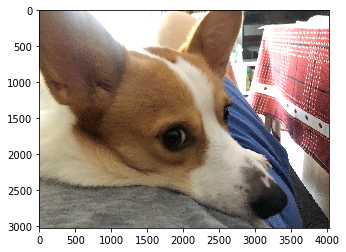

In [18]:
#showing picture
plt.imshow(imread(dango1))

In [19]:
#checking the dimensions of all the pictures.
dim1 = []
dim2 = []
for image_filename in os.listdir(test_path+'bubble'):
    img = imread(test_path + 'bubble\\' +image_filename)
    d1,d2,colors = img.shape
    dim1.append(d1)
    dim2.append(d2)

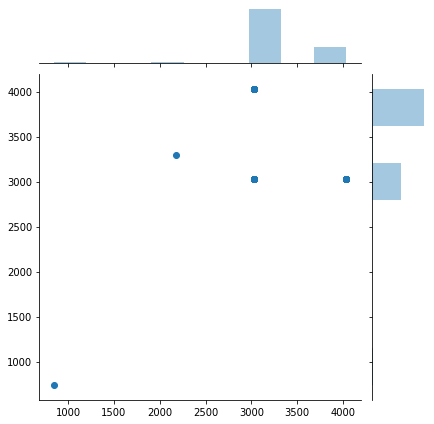

In [20]:
#graphing said dimensions. Seems like our pictures are /really/ large, 
#so we'll have to descale them or else it'll take forever to process.
sns.jointplot(dim1,dim2)

In [22]:
#average width and height
print(np.mean(dim1))
print("\n")
print(np.mean(dim2))

3213.752941176471


3628.8117647058825


In [24]:
#our downscaled image shape, as most images seem to share a 4:3 ratio we're 
#going to try to keep that. 
image_shape = (1000,750,3)

In [25]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [26]:
image_gen = ImageDataGenerator(rotation_range=20, # rotate the image 20 degrees
                               width_shift_range=0.10, # Shift the pic width by a max of 5%
                               height_shift_range=0.10, # Shift the pic height by a max of 5%
                               rescale=1/255, # Rescale the image by normalzing it.
                               shear_range=0.1, # Shear means cutting away part of the image (max 10%)
                               zoom_range=0.1, # Zoom in by 10% max
                               horizontal_flip=False, # Don't allow horizontal flipping
                               fill_mode='nearest' # Fill in missing pixels with the nearest filled value
                              )

In [27]:
image_gen.flow_from_directory(train_path)

Found 819 images belonging to 2 classes.


In [28]:
image_gen.flow_from_directory(test_path)

Found 170 images belonging to 2 classes.


In [29]:
from tensorflow.keras.models import Sequential

In [30]:
from tensorflow.keras.layers import Dense,Conv2D,MaxPool2D,Flatten,Dropout

In [38]:
#creating model. Final will be a dense 1 layer as we're doing a binary model
# result can only be one of two things.
model = Sequential()
model.add(Conv2D(filters=32,kernel_size=(3,3),input_shape= image_shape,activation='relu'))
model.add(MaxPool2D(pool_size = (2,2)))

model.add(Conv2D(filters=64,kernel_size=(3,3),input_shape= image_shape,activation='relu'))
model.add(MaxPool2D(pool_size = (2,2)))

model.add(Conv2D(filters=64,kernel_size=(3,3),input_shape= image_shape,activation='relu'))
model.add(MaxPool2D(pool_size = (2,2)))

model.add(Flatten())

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(1,activation='sigmoid'))

model.compile(loss='binary_crossentropy',optimizer= 'adam',metrics=['accuracy'])

In [39]:
from tensorflow.keras.callbacks import EarlyStopping

In [40]:
#implement early stopping
early_stop = EarlyStopping(monitor='val_loss',patience =2)

In [41]:
batch_size = 16

In [42]:
train_image_gen = image_gen.flow_from_directory(train_path, 
                                                target_size = image_shape[:2],
                                                color_mode = 'rgb',
                                                batch_size = batch_size,
                                                class_mode = 'binary')

Found 819 images belonging to 2 classes.


In [43]:
test_image_gen = image_gen.flow_from_directory(test_path, 
                                                target_size = image_shape[:2],
                                                color_mode = 'rgb',
                                                batch_size = batch_size,
                                                class_mode = 'binary',
                                              shuffle = False)

Found 170 images belonging to 2 classes.


In [44]:
#checking the classes.
train_image_gen.class_indices

{'bubble': 0, 'dango': 1}

In [45]:
#fitting the model. 
results = model.fit_generator(train_image_gen,epochs=20,validation_data= test_image_gen,callbacks =[early_stop])

Instructions for updating:
Please use Model.fit, which supports generators.
  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 52 steps, validate for 11 steps
Epoch 1/20
52/52 [==============================] - 417s 8s/step - loss: 1.5094 - accuracy: 0.5189 - val_loss: 0.6740 - val_accuracy: 0.6176
Epoch 2/20
52/52 [==============================] - 396s 8s/step - loss: 0.6728 - accuracy: 0.5482 - val_loss: 0.6847 - val_accuracy: 0.5765
Epoch 3/20
52/52 [==============================] - 398s 8s/step - loss: 0.6584 - accuracy: 0.6203 - val_loss: 0.6114 - val_accuracy: 0.6529
Epoch 4/20
52/52 [==============================] - 429s 8s/step - loss: 0.6343 - accuracy: 0.6569 - val_loss: 0.5891 - val_accuracy: 0.6412
Epoch 5/20
52/52 [==============================] - 403s 8s/step - loss: 0.5908 - accuracy: 0.6911 - val_loss: 0.5877 - val_accuracy: 0.6588
Epoch 6/20
52/52 [==============================] - 404s 8s/step - loss: 0.6438 - accuracy: 0.6618 - val_loss: 0.6289 - val_acc

In [46]:
#create dataframe based on epochs 
metrics = pd.DataFrame(model.history.history)

In [47]:
metrics.columns

Index(['loss', 'accuracy', 'val_loss', 'val_accuracy'], dtype='object')

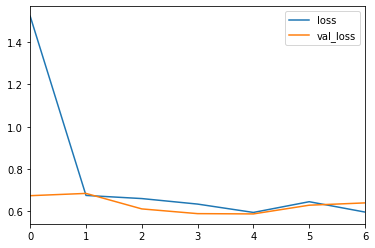

In [48]:
#graph loss vs validation loss
metrics[['loss', 'val_loss']].plot()

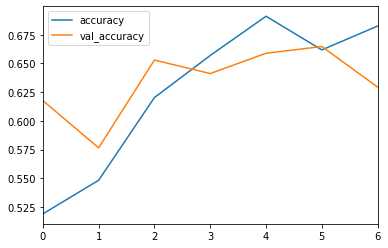

In [49]:
#graph accuracy vs validation accuracy
metrics[['accuracy', 'val_accuracy']].plot()

In [50]:
#evaluate the model
model.evaluate(test_image_gen)

  ...
    to  
  ['...']
11/11 [==============================] - 46s 4s/step - loss: 0.6090 - accuracy: 0.6529


[0.6089854565533724, 0.65294117]

In [51]:
#start predictions
pred= model.predict(test_image_gen)

In [52]:
#create a boolean for predictions
predictions = pred > 0.5

In [53]:
#checking length
len(pred)

170

In [54]:
#import classification reports
from sklearn.metrics import classification_report, confusion_matrix

In [56]:
print(classification_report(test_image_gen.classes,predictions))

              precision    recall  f1-score   support

           0       0.64      0.61      0.63        85
           1       0.63      0.66      0.64        85

    accuracy                           0.64       170
   macro avg       0.64      0.64      0.64       170
weighted avg       0.64      0.64      0.64       170



In [57]:
# import image to try the CNN model. 
from tensorflow.keras.preprocessing import image

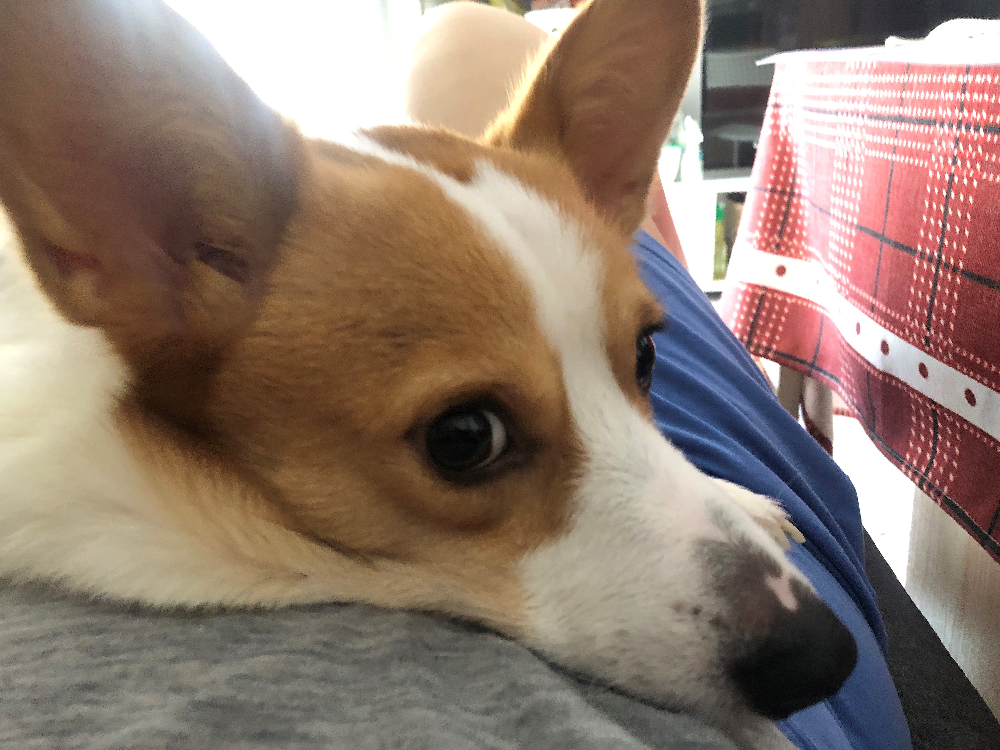

In [58]:
image.load_img(dango1)

In [59]:
#create image variable based off of the one above.
my_image = image.load_img(dango1,target_size = image_shape)

In [60]:
#change it to an array
my_img_arr = image.img_to_array(my_image)

In [61]:
my_img_arr.shape

(1000, 750, 3)

In [62]:
#create an index on first column.
my_img_arr= np.expand_dims(my_img_arr,axis=0)

In [74]:
model.predict(my_img_arr)

array([[2.395503e-21]], dtype=float32)

In [64]:
os.listdir(train_path+'bubble')[1]

'04195db3-a69a-489e-8cd0-8605831a1ce5.HEIC'

In [65]:
bubble1 = train_path + 'bubble\\' + 'IMG_4201.JPG'


In [71]:
#

In [73]:
image_2 = image.load_img(bubble1,target_size = image_shape)

In [67]:
image_2_arr = image.img_to_array(image_2)

In [68]:
image_2_arr = np.expand_dims(image_2_arr ,axis=0)

In [69]:
model.predict(image_2_arr)

array([[1.]], dtype=float32)

In [67]:
tester = train_path + 'tester.JPG'

In [69]:
tester_img = image.load_img(tester,target_size = image_shape)

In [70]:
tester_arr = image.img_to_array(tester_img)

In [71]:
tester_arr = np.expand_dims(tester_arr,axis = 0 )

In [72]:
model.predict(tester_arr)

array([[0.5231307]], dtype=float32)

In [ ]:
# seems like the model isn't the greatest as it is 
#incorrectly predicting half the time.
# In order to increase accuracy the biggest thing is to increase the dataset, 
#as 4-500 images are a little small. 